In [16]:
import scanpy as sc
import anndata as ad
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import median_abs_deviation
import numpy as np
import os
import re
import warnings
from numba.core.errors import NumbaDeprecationWarning
import urllib.request
from pathlib import Path
import celltypist
from celltypist import models
from scipy.sparse import csr_matrix
# import scarches as sca

In [17]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

In [18]:
# import preprocessed dataset

dir = "PBMC_datasets/1/PBMC1_preprocessed.h5ad"

adata = sc.read(dir)

In [19]:
# save raw counts first
adata.layers["counts"] = adata.X.copy()

# then set normalised as active layer for PCA
adata.X = adata.layers["log1p_norm"]

In [20]:
# compute PCA
sc.pp.pca(
    adata, svd_solver="arpack", use_highly_variable=True)

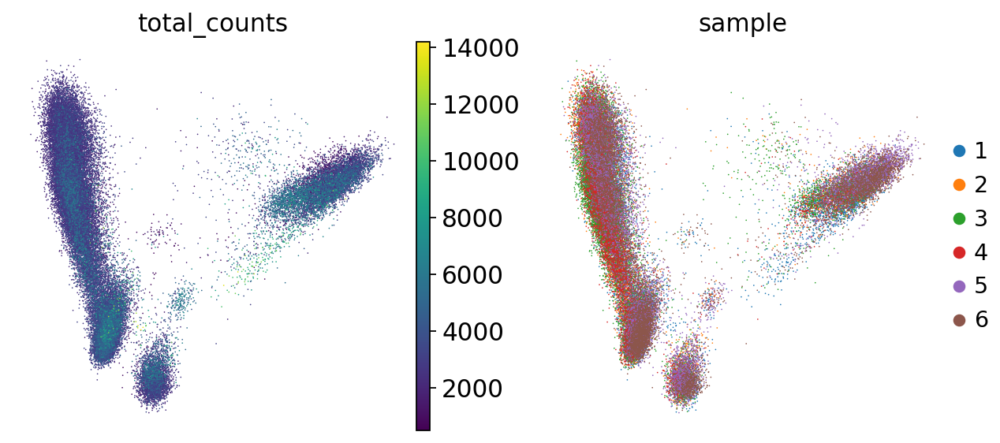

In [21]:
# plot PCA
sc.pl.pca_scatter(adata, color= ["total_counts", "sample"])
# color by total counts and sample to check for batch effects

In [22]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=80, facecolor="white", frameon=False)

In [23]:
# build neighbour graph (used for leiden clustering and UMAP) using the first 30 principal components (stick with this defualt?)
sc.pp.neighbors(adata, n_pcs=30)

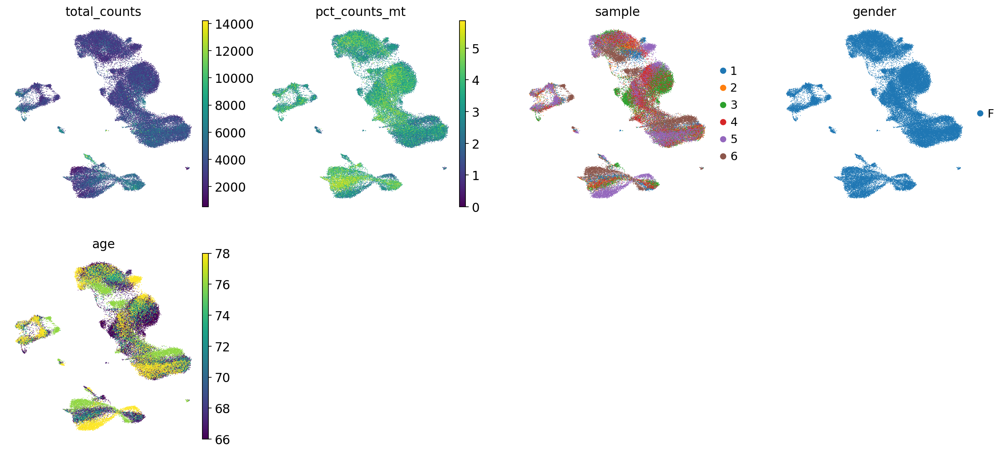

In [24]:
# compute UMAP
sc.tl.umap(adata)

# plot UMAP to check quality control metrics, i.e. see if cells are clustering by non-biological factors
sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt", "sample", "gender", "age"]
)

In [25]:
# batch correction for age

import harmonypy as hm

ho = hm.run_harmony(adata.obsm["X_pca"], adata.obs, "sample")
adata.obsm["X_pca_harmony"] = ho.Z_corr


print(adata.obsm["X_pca_harmony"].shape)


2026-08-05 11:28:24,777 - harmonypy - INFO - Running Harmony (PyTorch on cpu)
Running Harmony (PyTorch on cpu)
2026-08-05 11:28:24,778 - harmonypy - INFO -   Parameters:
  Parameters:
2026-08-05 11:28:24,779 - harmonypy - INFO -     max_iter_harmony: 10
    max_iter_harmony: 10
2026-08-05 11:28:24,779 - harmonypy - INFO -     max_iter_kmeans: 20
    max_iter_kmeans: 20
2026-08-05 11:28:24,780 - harmonypy - INFO -     epsilon_cluster: 1e-05
    epsilon_cluster: 1e-05
2026-08-05 11:28:24,780 - harmonypy - INFO -     epsilon_harmony: 0.0001
    epsilon_harmony: 0.0001
2026-08-05 11:28:24,780 - harmonypy - INFO -     nclust: 100
    nclust: 100
2026-08-05 11:28:24,781 - harmonypy - INFO -     block_size: 0.05
    block_size: 0.05
2026-08-05 11:28:24,781 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1.]
    lamb: [1. 1. 1. 1. 1. 1.]
2026-08-05 11:28:24,782 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2.]
    theta: [2. 2. 2. 2. 2. 2.]
2026-08-05 11:28:24,782 - harmonypy - INFO -     sig

(54057, 50)


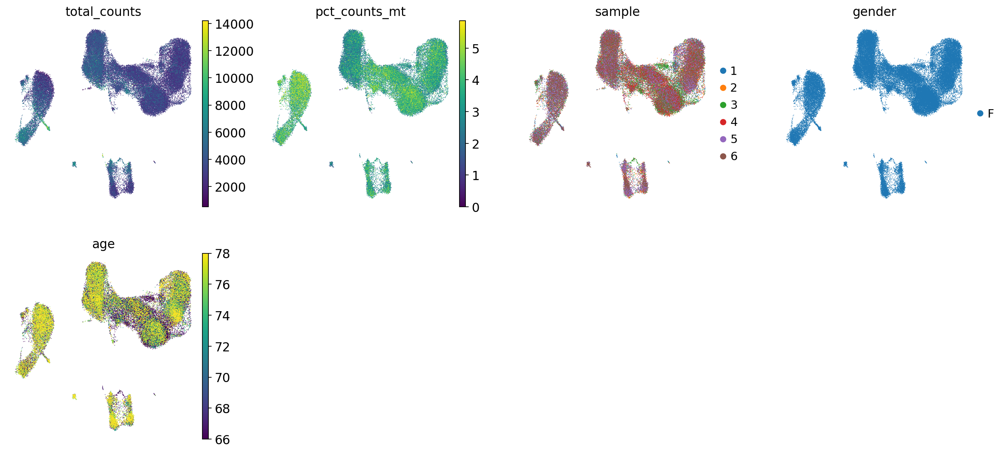

In [26]:
# recompute UMAP and neighbours using corrected data

sc.pp.neighbors(adata, use_rep="X_pca_harmony")
sc.tl.umap(adata) #writes to X_umap

# plot to check for overcorrection

sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt", "sample", "gender", "age"]
)

In [27]:
# Cluster the data using Leiden clustering (trying different resolutions for finer/coarser clustering)
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)
sc.tl.leiden(adata, key_added="leiden_res2", resolution=2)


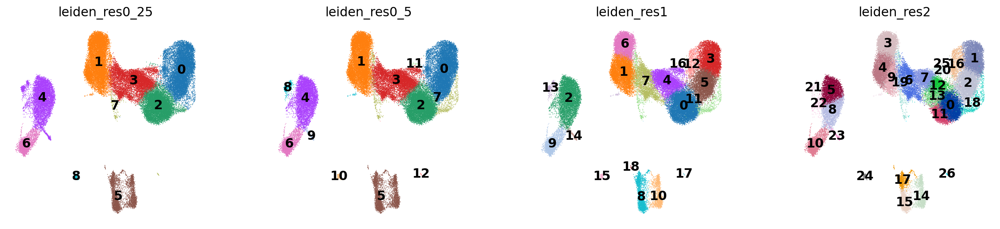

In [28]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_5", "leiden_res1", "leiden_res2"],
    legend_loc="on data",
    # size = 4,
    # legend_fontsize=10,

)

In [29]:
# setup for annotation
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.simplefilter("ignore", category=NumbaDeprecationWarning)
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

sc.set_figure_params(figsize=(5, 5))

In [30]:
# list of marker genes for different cell types (from sc-best practices)
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
     "B cells": [
        "MS4A1",
        "ITGB1",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
    ], # from scanpy (broader)
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T": ["CD4", "IL7R", "TRBC2"], # from scanpy (broader)
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}


In [31]:
# Subset to only the markers that were detected in our data
marker_genes_in_data = {}
for ct, markers in marker_genes.items():
    markers_found = []
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

print(f"The data contains {len(marker_genes_in_data)} out of {len(marker_genes)} cell type marker genes")

The data contains 27 out of 27 cell type marker genes


In [32]:
# show expression of markers using UMAP (first only looking at broad cell types)
# note: IGHD and IGHM for B1 B, and PAX5 for plasmablasts are negative markers (cell type expected not to or lowly express markers)

broad_cts = [
    "B cells", 
    "Plasma cells",
    "CD4+ T",   
    "CD8+ T",
    "T naive",
    "NK",
    "CD14+ Mono",
    "CD16+ Mono",
    "cDC2",           # representative DC
    "pDC",
]

B CELLS:


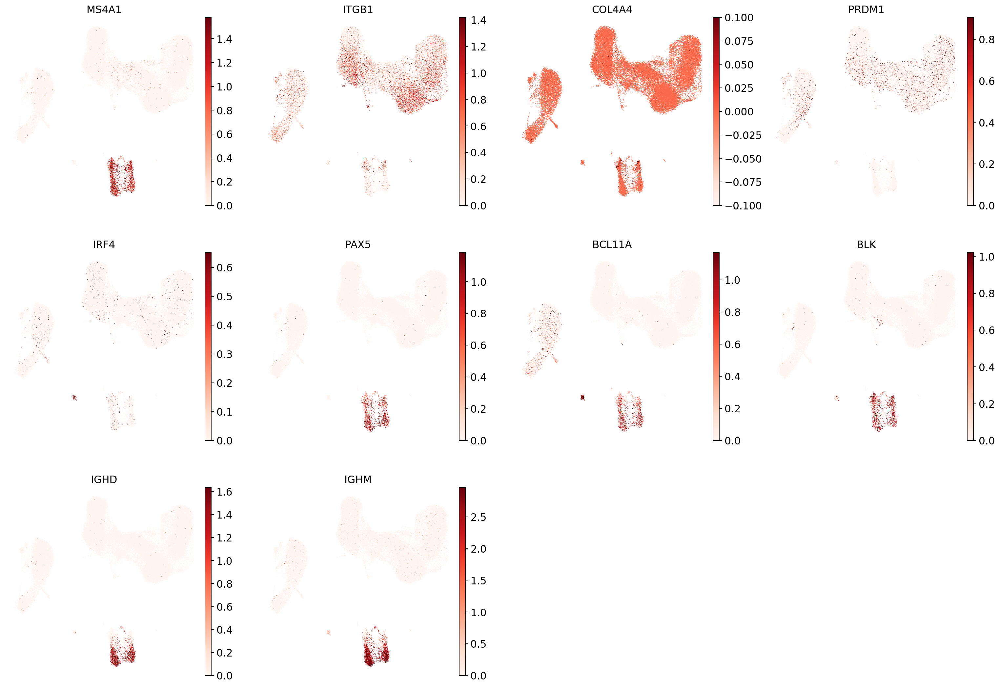





PLASMA CELLS:


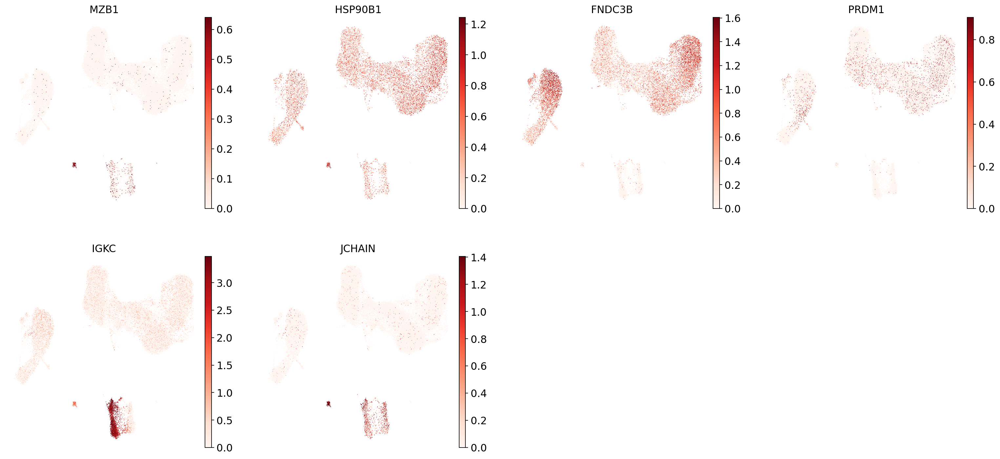





CD4+ T:


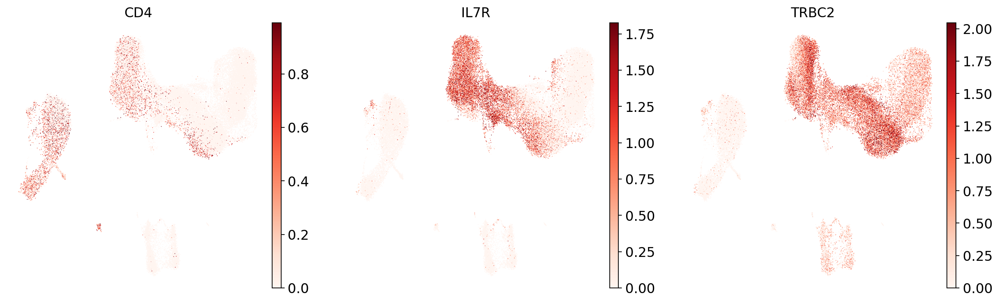





CD8+ T:


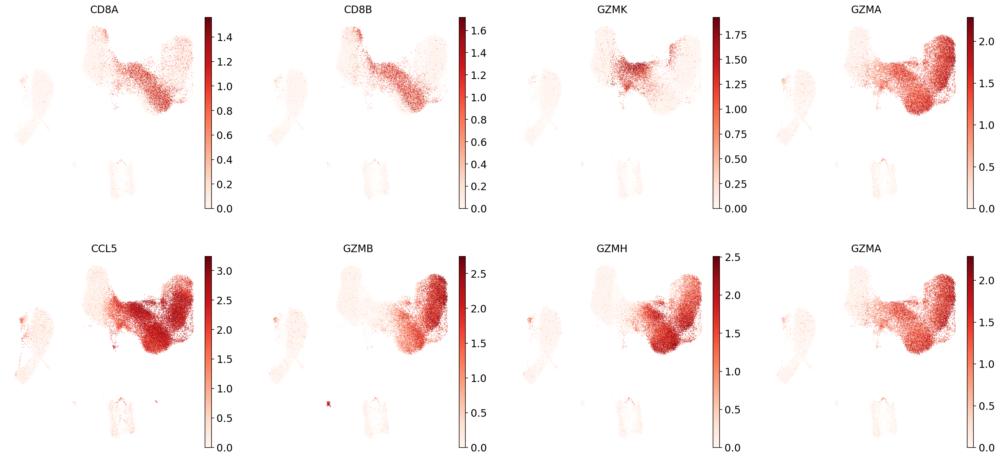





T NAIVE:


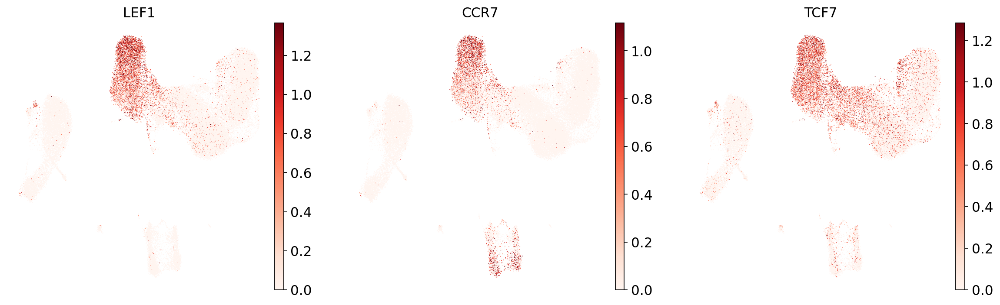





NK:


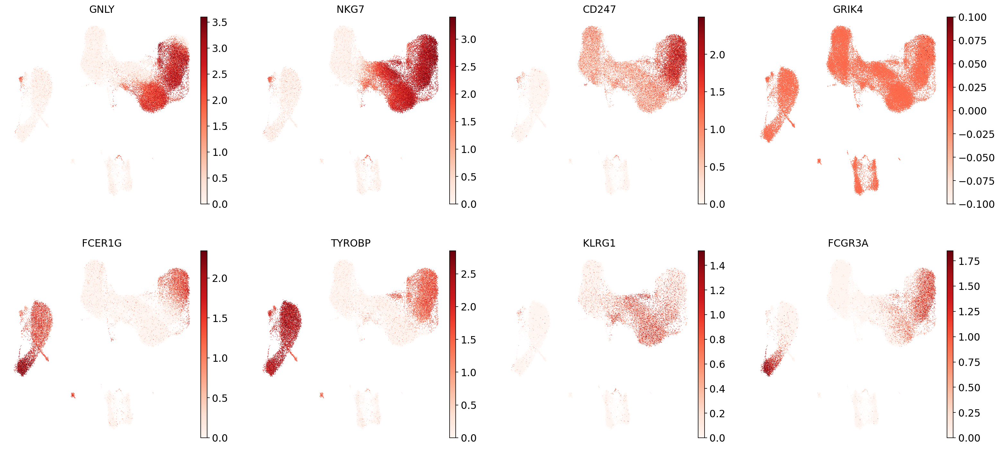





CD14+ MONO:


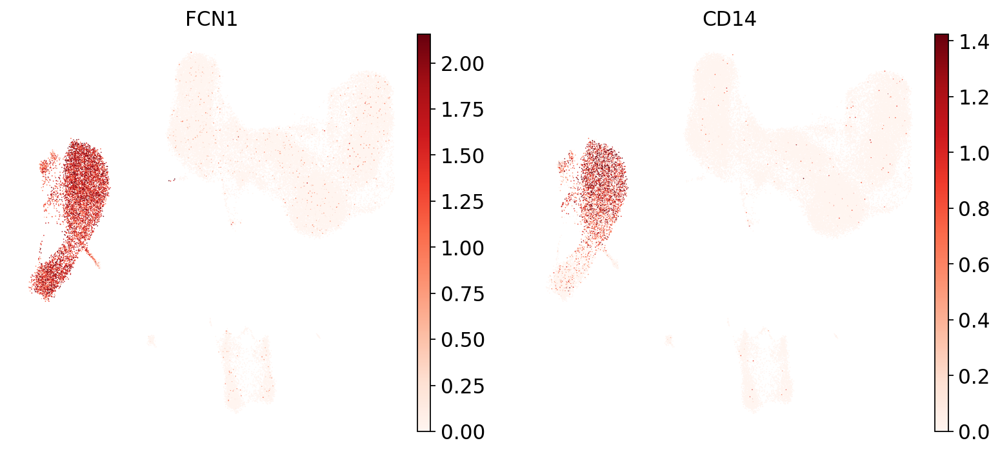





CD16+ MONO:


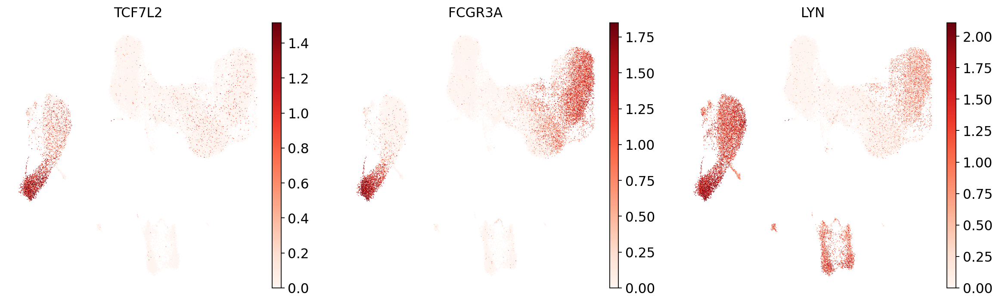





CDC2:


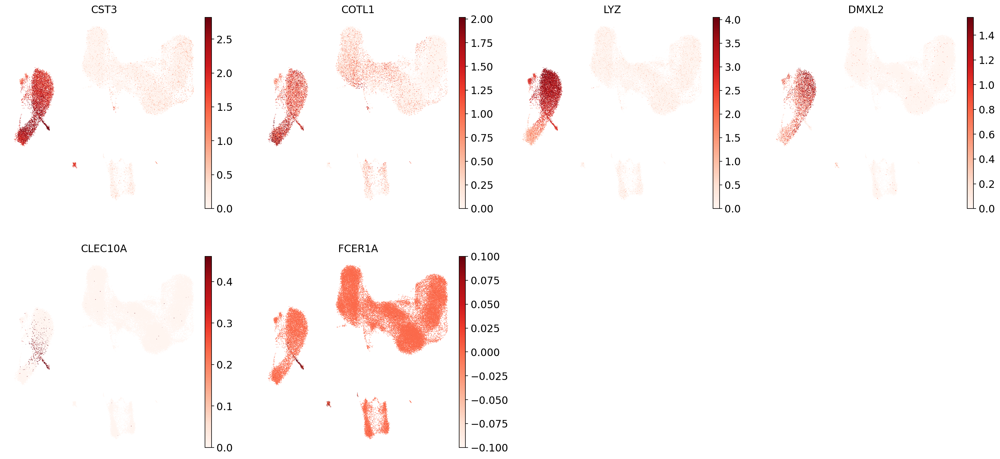





PDC:


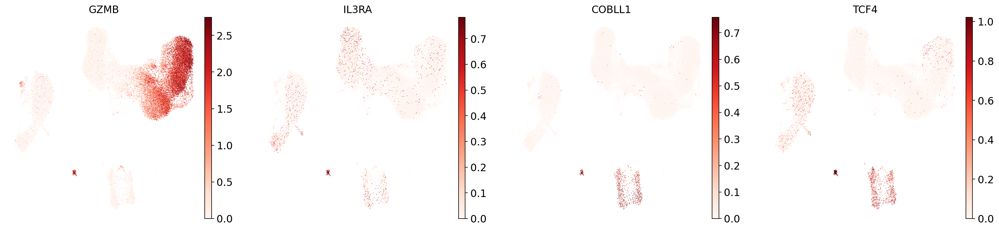

In [33]:
# plot on UMAP per marker for each of the cell types (IOW, looking at expression of each marker for each subtype)

for ct in broad_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

In [34]:
# visualise using dotplot

broad_cts_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in broad_cts
}

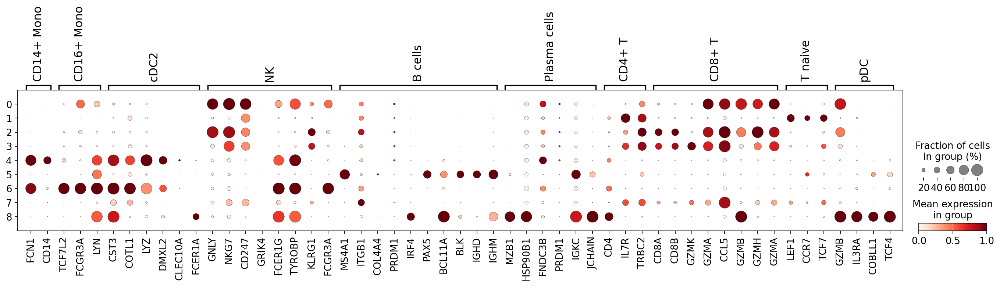

In [35]:
sc.pl.dotplot(
    adata,
    groupby="leiden_res0_25",   # rows = leiden clusters at resolution 0.5
    var_names=broad_cts_markers,  # columns = list of broad ct marker genes
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1 (so genes with different expression scales are comparable)
)

# Size of dot   → fraction of cells in that cluster expressing the gene (bigger = more cells express it)
# Colour of dot → expression level (scaled 0-1 per gene) (darker = higher expression)

In [36]:
# try the other way round: calculate marker genes per cluster first (using Wilcoxon rank-sum test)

sc.tl.rank_genes_groups(
    adata, groupby="leiden_res0_25", method="wilcoxon", key_added="dea_leiden_0_25"
)

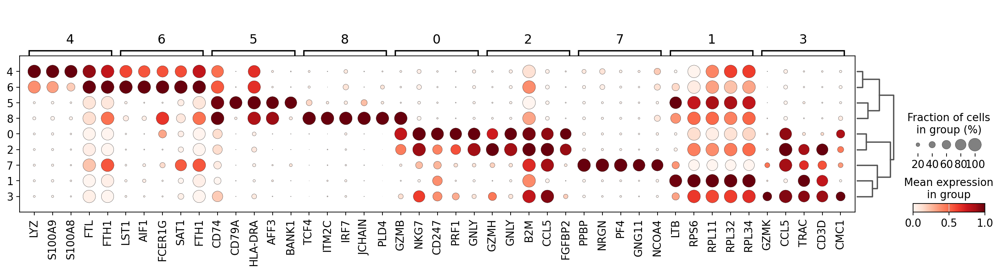

In [37]:
# visusalise expression of top DEGs per cluster with dotplot

sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res0_25", standard_scale="var", n_genes=5, key="dea_leiden_0_25"
)


In [38]:
# filter the DEGs to select for more cluster-specific DEGs

sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_0_25",
    key_added="dea_leiden_0_25_filtered",
)

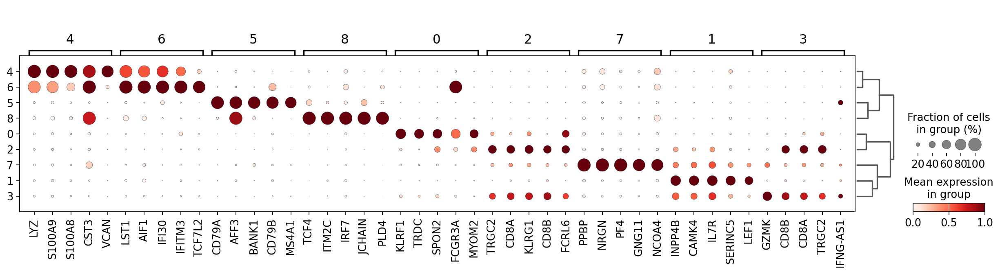

In [39]:
# visualise filtered genes

sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_res0_25",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_0_25_filtered",
)

# PLCB1, PAX5, IGHD, IGHM, HBM, GYPA, DMXL2 --> negative markers

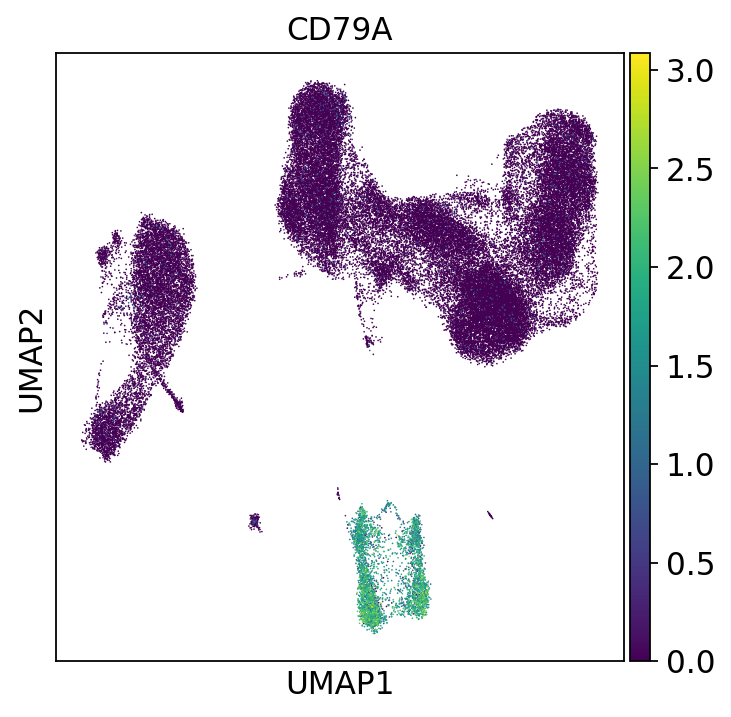

In [40]:
sc.pl.umap(adata, color=["CD79A"])


In [41]:
# (using filtered dotplot and Claude) annotating cell types manually at res 0.25 (9 clusters)
cl_10_annotation = {
    "0" : "NK/gDT",
    "6" : "CD16+ MONO",
    "7" : "pDC",
    "5" : "B CELLS",
    "9" : "Lymphoid progenitors?",
    "1" : "Naive T cells",
    "4" : "CD14+ MONO",
    "8" : "Platelets", # need to be removed?
    "2" : "CD8+ Temra",
    "3" : "CD8+ Tem "
}

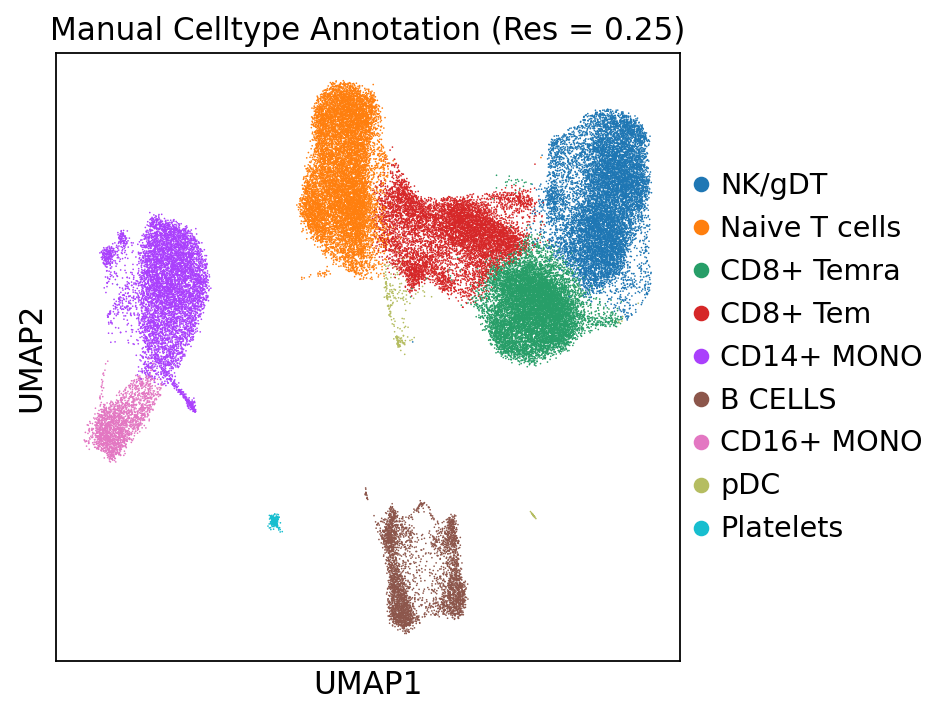

In [42]:
# visualise annotation

adata.obs["manual_celltype_annotation_0_25"] = adata.obs.leiden_res0_25.map(cl_10_annotation)
sc.pl.umap(adata, color=["manual_celltype_annotation_0_25"],  title = "Manual Celltype Annotation (Res = 0.25)")

In [43]:
# Automated Annotation

In [44]:
# CellTypist

# first prepare data to format needed for cellTypist (nromalised to 10,000 counts per cell then log1p transformed)

adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata.layers["counts"].copy()  # set adata.X to raw counts
sc.pp.normalize_total(
    adata_celltypist, target_sum=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

In [45]:
# download celltypist models for immune cells 
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"]
)

model_low = models.Model.load(model="Immune_All_Low.pkl") # finer annotation level
model_high = models.Model.load(model="Immune_All_High.pkl") # coarser annotation level

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 61
📂 Storing models in /rds/general/user/ztb25/home/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


In [46]:
# see which cell types each model includes

display(model_high.cell_types)
display(model_low.cell_types)

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [47]:
# run high model 

predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True 
)

predictions_high_adata = predictions_high.to_adata() # transform predictions to adata for full output

# copy results into original AnnData obj
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

🔬 Input data has 54057 cells and 19936 genes


🔗 Matching reference genes in the model
🧬 5394 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [48]:
# run low model

predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

predictions_low_adata = predictions_low.to_adata()

adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

🔬 Input data has 54057 cells and 19936 genes
🔗 Matching reference genes in the model
🧬 5394 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


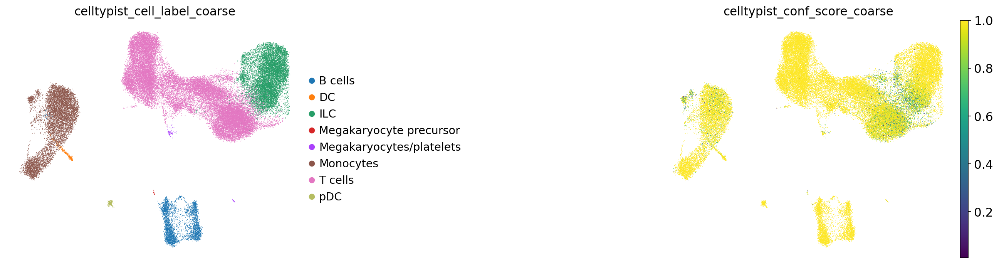

In [49]:
# plot (coarse)

sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)


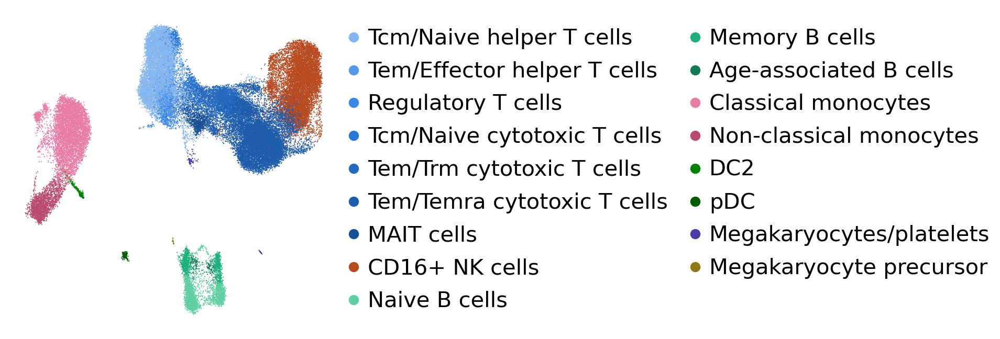

In [107]:
# plot (fine)

sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine"],
    frameon=False,
    sort_order=False,
    wspace=2,
    title = ""
)

In [96]:
# Hue = lineage (matches COARSE_COLORS), lightness step = subtype within lineage.
# This makes coarse and fine figures visually consistent, which is worth a lot
# when they sit on facing pages.
FINE_COLORS = {
    # T cells — blue ramp (documented ordinal steps)
    "Tcm/Naive helper T cells":     "#86b6ef",
    "Tem/Effector helper T cells":  "#5598e7",
    "Regulatory T cells":           "#3987e5",
    "Tcm/Naive cytotoxic T cells":  "#2a78d6",
    "Tem/Trm cytotoxic T cells":    "#256abf",
    "Tem/Temra cytotoxic T cells":  "#1c5cab",
    "MAIT cells":                   "#184f95",
    # NK / ILC — orange family
    "NK cells":                     "#eb6834",
    "CD16+ NK cells":               "#b84a20",
    "ILC":                          "#f59b72",
    # B — aqua family
    "Naive B cells":                "#5fcfa2",
    "Memory B cells":               "#1baf7a",
    "Age-associated B cells":       "#127a55",
    "Plasma cells":                 "#eda100",
    # Myeloid — magenta family
    "Classical monocytes":          "#e87ba4",
    "Non-classical monocytes":      "#b8496f",
    # DC — green family
    "DC1":                          "#4fb14f",
    "DC2":                          "#008300",
    "pDC":                          "#005a00",
    # other
    "Megakaryocytes/platelets":     "#4a3aa7",
    "HSC/MPP":                      "#e34948",
    "Megakaryocyte precursor":     "#8e7815",

}


In [99]:
col = "celltypist_cell_label_fine"

# fix category order, then write colours in that same order
# (scanpy matches uns colours to categories by POSITION, so the order must match)
labels = [lab for lab in FINE_COLORS if lab in set(adata.obs[col].astype(str))]
adata.obs[col] = pd.Categorical(adata.obs[col].astype(str), categories=labels, ordered=True)
adata.uns[f"{col}_colors"] = [FINE_COLORS[lab] for lab in labels]

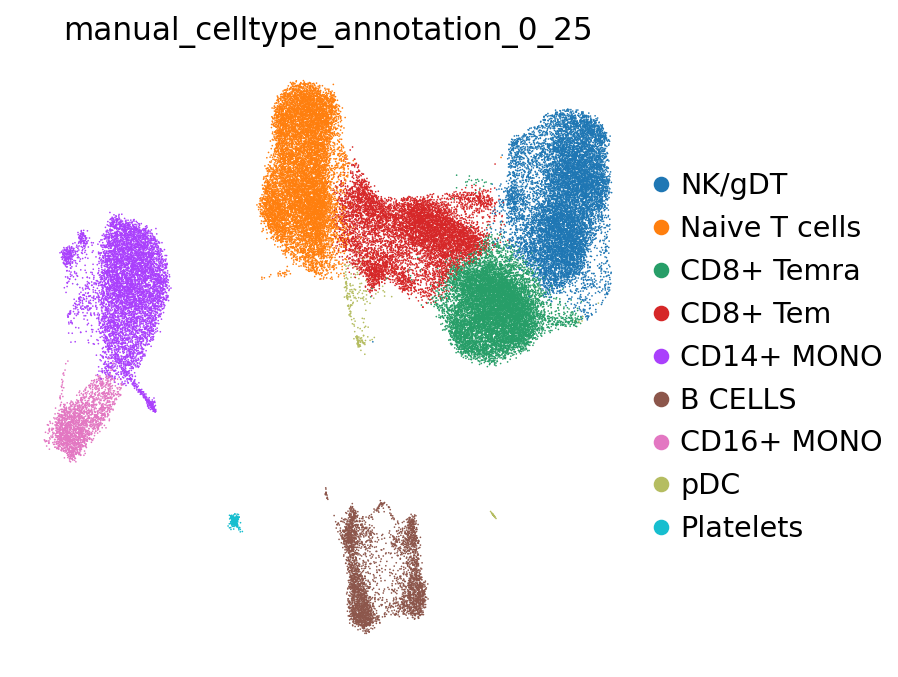

In [51]:
# compare to manual anno
sc.pl.umap(
    adata,
    color=["manual_celltype_annotation_0_25"],
    frameon=False,
)

In [52]:
# generate relative cell frequency table per sample

# Count cells per cell type per sample
freq_table = adata.obs.groupby(['sample', "celltypist_cell_label_coarse"]).size().reset_index(name='count')

# Calculate proportions within each sample
freq_table['proportion'] = freq_table.groupby('sample')['count'].transform(lambda x: x / x.sum())

# Pivot to wide format (samples as rows, cell types as columns)
prop_table = freq_table.pivot(index='sample', columns='celltypist_cell_label_coarse', values='proportion').fillna(0)

# Add diagnosis info
sample_meta = adata.obs[['sample', 'diagnosis']].drop_duplicates().set_index('sample')
prop_table = prop_table.join(sample_meta)

prop_table


,B cells,DC,ILC,Megakaryocyte precursor,Megakaryocytes/platelets,Monocytes,T cells,pDC,diagnosis
sample,,,,,,,,,
1,0.049921,0.012057,0.250026,0.001586,0.002327,0.193866,0.485880,0.004336,CTRL
2,0.077748,0.001143,0.255395,0.000000,0.001143,0.122481,0.539517,0.002573,CTRL
3,0.045091,0.000982,0.157024,0.000076,0.001662,0.092447,0.702417,0.000302,PD
4,0.053468,0.001109,0.204632,0.000000,0.001725,0.078231,0.658864,0.001971,PD
5,0.122662,0.005061,0.208471,0.000000,0.000440,0.236634,0.418482,0.008251,PD
6,0.077815,0.007404,0.190556,0.000000,0.004191,0.245460,0.466471,0.008103,PD


In [53]:
# check what is there
[k for k in adata.uns.keys() if "dea" in k or "rank_genes" in k]

['dea_leiden_0_25', 'dea_leiden_0_25_filtered']

In [106]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import scanpy as sc

# Thesis figure defaults.
# The figure is built at its FINAL printed size, so point sizes here are true
# point sizes on the page — no rescaling in Word/LaTeX afterwards.

sc.set_figure_params(
    scanpy=True,
    dpi=100,          # on-screen preview
    dpi_save=400,     # only matters for raster formats
    frameon=False,
    vector_friendly=False,   # keep dots as true vectors, not embedded raster
    fontsize=11,
)

mpl.rcParams.update({
    "font.size":        18,   # base — everything else inherits from this
    "axes.titlesize":   20,
    "axes.labelsize":   10,   # "Genes" / "Cell type" axis titles
    "xtick.labelsize":  10,   # gene names
    "ytick.labelsize":  18,   # cell type labels
    "legend.fontsize":  15,
    "legend.title_fontsize": 20,
    "figure.titlesize": 20,
    "font.family":      "sans-serif",
    "font.sans-serif":  ["Arial", "Helvetica", "DejaVu Sans"],
    "pdf.fonttype":     42,   # embed real fonts, not outlines — keeps text selectable/editable
    "ps.fonttype":      42,
    "savefig.bbox":     "tight",
    "savefig.transparent": False,
})


In [88]:
adata.X = adata.layers["log1p_norm"].copy()

# Canonical PBMC markers, keyed to the CellTypist Immune_All_Low label strings
# used in `celltypist_cell_label_fine`. Grouping the dict this way makes scanpy
# draw the labelled brackets above the columns.
canonical_markers_fine = {
    "T (pan)":            ["CD3D", "CD3E", "TRAC"],
    "Tcm/Naive helper":   ["CCR7", "SELL", "LEF1", "TCF7"],
    "Tem/Effector helper":["S100A4", "AQP3", "CCL5"],
    "Regulatory T":       ["FOXP3", "IL2RA", "CTLA4", "IKZF2"],
    "Tem/Temra cytotox":  ["GZMB", "GNLY", "NKG7", "FGFBP2", "CX3CR1"],
    "Tem/Trm cytotox":    ["GZMK", "CCL4", "KLRB1"],
    "MAIT":               ["SLC4A10", "KLRB1", "TRAV1-2", "RORC"],
    "CD16+ NK":           ["FCGR3A", "PRF1", "SPON2"],
    "ILC":                ["IL7R", "KIT", "RORC"],
    "B (pan)":            ["MS4A1", "CD79A", "CD79B"],
    "Naive B":            ["IGHD", "IGHM", "TCL1A", "FCER2"],
    "Memory B":           ["CD27", "AIM2", "TNFRSF13B"],
    "Age-associated B":   ["ITGAX", "TBX21", "FCRL5"],
    "Classical mono":     ["CD14", "LYZ", "S100A8", "S100A9", "VCAN"],
    "Non-classical mono": ["FCGR3A", "MS4A7", "CDKN1C", "LST1"],
    "DC1":                ["CLEC9A", "XCR1", "CADM1"],
    "DC2":                ["FCER1A", "CD1C", "CLEC10A"],
    "pDC":                ["LILRA4", "IRF7", "GZMB", "CLEC4C"],
    "Megakaryocyte":      ["PPBP", "PF4", "ITGA2B"],
    "HSC/MPP":            ["CD34", "SPINK2", "PRSS57"],
}

# Drop any genes absent from var_names (differs per dataset after HVG/QC filtering)
# — sc.pl.dotplot errors out on a missing gene rather than skipping it.
canonical_markers_present = {
    label: [g for g in genes if g in adata.var_names]
    for label, genes in canonical_markers_fine.items()
}
canonical_markers_present = {k: v for k, v in canonical_markers_present.items() if v}

missing = {g for genes in canonical_markers_fine.values() for g in genes} - set(adata.var_names)
print(f"Markers not present in this object ({len(missing)}): {sorted(missing)}")


Markers not present in this object (2): ['CD34', 'XCR1']


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 64 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'V', 'X', 'Y', 'Z', 'a', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'plus', 'r', 's', 'seven', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'v', 'x', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 8, 11, 12, 14, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 68, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 91, 92]
Closed glyph list over 'MATH': 70 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E',

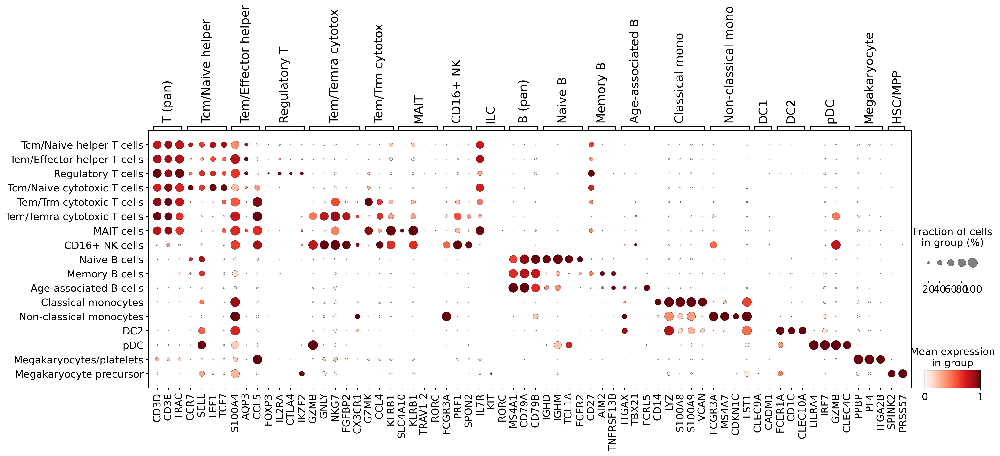

In [89]:
# Order rows lineage-wise so the strong dots fall roughly on the diagonal.
celltype_order = [
    "Tcm/Naive helper T cells", "Tem/Effector helper T cells", "Regulatory T cells",
    "Tcm/Naive cytotoxic T cells", "Tem/Trm cytotoxic T cells",
    "Tem/Temra cytotoxic T cells", "MAIT cells",
    "NK cells", "CD16+ NK cells", "ILC",
    "Naive B cells", "Memory B cells", "Age-associated B cells", "Plasma cells",
    "Classical monocytes", "Non-classical monocytes",
    "DC1", "DC2", "pDC",
    "Megakaryocytes/platelets", "HSC/MPP",
]
# keep only labels actually present, then append any I missed so nothing is silently dropped
observed = adata.obs["celltypist_cell_label_fine"].astype(str).unique().tolist()
celltype_order = [c for c in celltype_order if c in observed] + \
                 [c for c in observed if c not in celltype_order]

adata.obs["celltypist_cell_label_fine"] = pd.Categorical(
    adata.obs["celltypist_cell_label_fine"].astype(str), categories=celltype_order, ordered=True
)

sc.pl.dotplot(
    adata,
    var_names=canonical_markers_present,
    groupby="celltypist_cell_label_fine",
    standard_scale="var",   # scale each gene 0–1 so genes with different dynamic ranges are comparable
    dendrogram=False,       # keep my biological ordering rather than a clustered one
    swap_axes=False,        # rows = cell types, cols = genes
    figsize=(22, 7),
    save="_celltypist_fine_canonical_markers.pdf",
)
# dot size   = fraction of cells in that label expressing the gene
# dot colour = mean expression within expressing cells, scaled 0–1 per gene


In [41]:
# deleting 
for k in ["dea_leiden_0_25_filtered", "dea_leiden_0_25"]:
    if k in adata.uns:
        del adata.uns[k]

adata.write("/rds/general/user/ztb25/home/PBMC_datasets/1/PBMC1_clustering.h5ad")